# Pre-processing

# 1) importing key modules

In [0]:
#support both Python 2 and Python 3 with minimal overhead.
from __future__ import absolute_import, division, print_function
#ignore warnings
import warnings
warnings.filterwarnings('ignore')

In [0]:
import numpy as np 
import pandas as pd
import requests
import pickle
from scipy import stats
from scipy.stats import norm, skew #for some statistics

In [0]:
#For Visuals
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
from matplotlib import rcParams
rcParams['figure.figsize'] = 11, 8
%config InlineBackend.figure_format = 'svg'
%matplotlib inline

## 2)- Loading data-files

In [0]:
df = pd.read_csv('testset1.csv')

In [5]:
df.head(2)

,m1,m2,m3,m4,m5,m6,m7,m8,m9,m10,m11,m12,m13,m14,m15,m16,m17,m18,m19,m20,m21,m22,m23,m24,m25
0,0.572565,-0.014704,-0.352985,-0.012697,-0.138549,0.620313,-0.602656,-0.071517,-0.131941,-0.067118,0.227895,0.201719,1.208013,-0.053193,1.429263,-0.199931,-0.360027,0.154202,0.369976,0.320812,1.252255,1.154858,0.609724,-0.126952,0.075709
1,-1.271232,0.754440,-0.206883,-0.572400,-0.303629,1.783537,0.338053,0.684332,0.780279,0.981463,1.001373,-0.554717,-0.095089,-0.552149,-0.545233,1.112403,-0.317894,0.062038,-0.539969,-0.475836,0.734146,-0.377487,-0.449741,0.386476,0.419884


In [6]:
df.shape

(80000, 25)

# 3)- Data exploring

In [7]:
df.describe()

,m1,m2,m3,m4,m5,m6,m7,m8,m9,m10,m11,m12,m13,m14,m15,m16,m17,m18,m19,m20,m21,m22,m23,m24,m25
count,80000.000000,80000.000000,80000.000000,80000.000000,80000.000000,80000.000000,80000.000000,80000.000000,80000.000000,80000.000000,80000.000000,80000.000000,80000.000000,80000.000000,80000.000000,80000.000000,80000.000000,80000.000000,80000.000000,80000.000000,80000.000000,80000.000000,80000.000000,80000.000000,80000.000000
mean,0.005630,0.002434,-0.000369,0.005743,0.002930,-0.000097,0.003520,-0.001496,-0.001515,-0.001840,0.002847,0.000909,0.004899,-0.002360,-0.004452,0.003258,-0.002942,0.002571,0.001263,-0.000819,0.001856,-0.002779,-0.000145,0.000813,-0.004723
std,0.908125,0.905131,0.903446,0.906404,0.908897,0.904891,0.905463,0.902215,0.907952,0.905982,0.903246,0.906655,0.909555,0.911349,0.904030,0.904316,0.909600,0.905053,0.904387,0.906825,0.910539,0.908904,0.906665,0.905759,0.909292
min,-4.007155,-3.754445,-3.681230,-3.729602,-4.297276,-3.665726,-3.678586,-3.621522,-4.313687,-4.288513,-3.975526,-4.071947,-3.542564,-3.875856,-3.969389,-3.695444,-3.833102,-3.751941,-3.533117,-3.820589,-3.794448,-3.682512,-4.026055,-3.740158,-4.254113
25%,-0.607355,-0.609342,-0.612841,-0.603481,-0.609553,-0.610429,-0.606015,-0.611983,-0.612950,-0.617716,-0.609020,-0.613260,-0.607241,-0.618789,-0.613624,-0.606614,-0.618799,-0.608848,-0.608155,-0.616014,-0.614418,-0.616405,-0.612727,-0.607428,-0.612503
50%,0.006063,0.001769,0.000188,0.003222,-0.000325,-0.000884,0.002014,-0.005207,-0.000393,-0.003440,0.005566,0.003231,0.004418,-0.005784,-0.003160,-0.000542,-0.004980,0.003294,-0.002160,-0.001607,0.003778,-0.004007,0.002419,0.001154,-0.007184
75%,0.616537,0.616380,0.606769,0.616373,0.614527,0.610843,0.609627,0.608240,0.608765,0.608645,0.611088,0.611137,0.615587,0.611805,0.607059,0.612078,0.612684,0.611257,0.615701,0.612610,0.616306,0.610319,0.613465,0.611401,0.605502
max,4.154659,3.709755,3.846479,3.908729,4.124183,3.735043,3.734139,3.526896,4.170037,3.877786,3.716980,3.743634,3.679282,3.654000,3.554147,3.866881,3.896698,3.759958,4.164395,3.656119,4.126930,3.952278,3.747106,3.737356,3.769383


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 80000 entries, 0 to 79999
Data columns (total 25 columns):
m1     80000 non-null float64
m2     80000 non-null float64
m3     80000 non-null float64
m4     80000 non-null float64
m5     80000 non-null float64
m6     80000 non-null float64
m7     80000 non-null float64
m8     80000 non-null float64
m9     80000 non-null float64
m10    80000 non-null float64
m11    80000 non-null float64
m12    80000 non-null float64
m13    80000 non-null float64
m14    80000 non-null float64
m15    80000 non-null float64
m16    80000 non-null float64
m17    80000 non-null float64
m18    80000 non-null float64
m19    80000 non-null float64
m20    80000 non-null float64
m21    80000 non-null float64
m22    80000 non-null float64
m23    80000 non-null float64
m24    80000 non-null float64
m25    80000 non-null float64
dtypes: float64(25)
memory usage: 15.3 MB


**All values show that they are numerical data. We have no categorical data in our dataset.**

### 3.1)- Check variables types

In [0]:
# Checking all variables with their data-type
def _tbl_dtype(dataset):
    sum_dtype = pd.DataFrame(dataset.dtypes).sort_values(0).rename(columns = {0:'Data Type'})
    return sum_dtype

In [10]:
table_dtype = _tbl_dtype(df)
table_dtype

,Data Type
m1,float64
m23,float64
m22,float64
m21,float64
m20,float64
m19,float64
m18,float64
m17,float64
m16,float64
m15,float64


Confirmed ! All numerical variables

### 3.2)-Checking missing values

In [0]:
def find_missing_values(df, columns):
    """
    Finds number of rows where certain columns are missing values.
    ::param_df:: = target dataframe
    ::param_columns:: = list of columns
    """
    missing_vals = {}
    print("Number of missing or NaN values for each column:")
    df_length = len(df)
    for column in columns:
        total_column_values = df[column].value_counts().sum()
        missing_vals[column] = df_length-total_column_values
        #missing_vals.append(str(column)+ " column has {} missing or NaN values.".format())
    return missing_vals

In [12]:
missing_values = find_missing_values(df, columns=df.columns)
missing_values

Number of missing or NaN values for each column:


{'m1': 0,
 'm10': 0,
 'm11': 0,
 'm12': 0,
 'm13': 0,
 'm14': 0,
 'm15': 0,
 'm16': 0,
 'm17': 0,
 'm18': 0,
 'm19': 0,
 'm2': 0,
 'm20': 0,
 'm21': 0,
 'm22': 0,
 'm23': 0,
 'm24': 0,
 'm25': 0,
 'm3': 0,
 'm4': 0,
 'm5': 0,
 'm6': 0,
 'm7': 0,
 'm8': 0,
 'm9': 0}

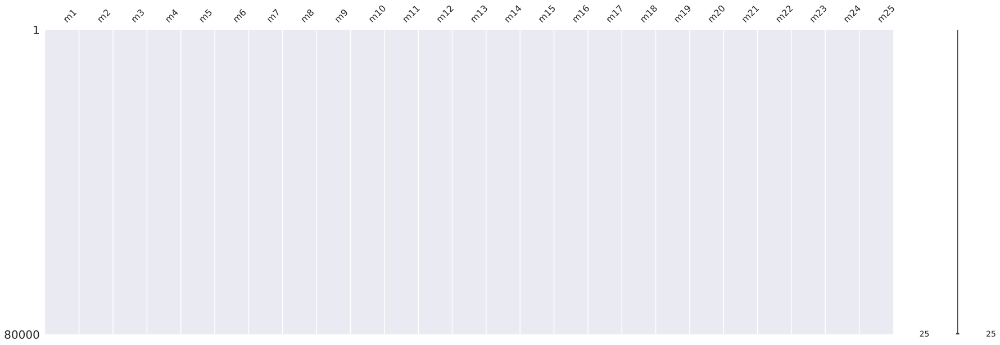

In [13]:
# Plot graphic of missing values
import missingno
missingno.matrix(df, figsize = (30,10))

**No missing values there**

### 3.3)-Outliers check

As all variables are same and we may think of each column representing a month from a time series. so, it does not matter which one to pick. Had we had different features then we would check all different feature with our target variable.

Target= m25

Indep variable= m1

In [14]:
fig, ax = plt.subplots()
ax.scatter(x = df['m1'], y = df['m25'])
plt.ylabel('Target variable', fontsize=13)
plt.xlabel('Independant Variable', fontsize=13)
plt.show()

So, data is fine shape. No skewed or scattered data. 

### 3.4)- Check relationship i.e correlation

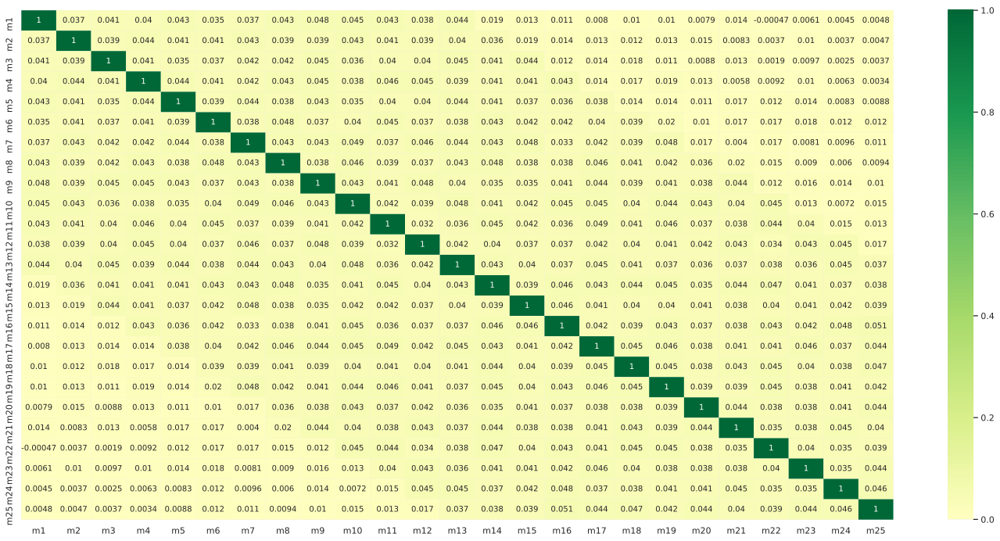

In [15]:
plt.figure(figsize=(25,12))
p = sns.heatmap(data=df.corr(method='spearman'), annot=True, cmap='RdYlGn', center=0)

again it is very calm there. None of these features have correlation greater 0.50. The diagnal shows correlation of a feature with itself so, 1 is outcome. 

We are safe to assume that all these features are independant of each other. It is one of main assumption for linear models in econometrics


### 3.5)-Nature of Target Variable


 mu = -0.00 and sigma = 0.91



Text(0.5, 1.0, 'Target feature distribution')

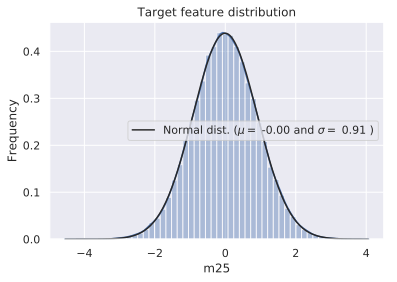

In [17]:
# Histogram plot of target feature
sns.distplot(df['m25'] , fit=norm);

# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(df['m25'])
print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))

# Plotting the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('Target feature distribution')

We have an ideal gaussian bell shaped distribution. So, our data is an ideal case.

### 3.6)-Probability plot or QQ plot

In [18]:
fig = plt.figure()
res = stats.probplot(df['m25'], plot=plt)
plt.show()

We have a perfect prob. plot that only comes in ideal situations or in fairy tales.